In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Show Code"></form>''')

# Data Spaces Thesis
**Antonio Alliegro, s250104, antonio.alliegro@studenti.polito.it**

In [1]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
# seaborn paper context
sns.set_context("paper", font_scale=1.4)
sns.set(style="whitegrid")

In [67]:
!pip install plotly --upgrade 
import plotly
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import Contours, Histogram2dContour, Marker, Scatter, Data, Layout, Figure
import plotly.tools as tools

init_notebook_mode()

# Function def: needed for using Plotly in Google Colab
# Call it in each offline plotting cell
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

Requirement already up-to-date: plotly in /Users/antonioalliegro/anaconda3/lib/python3.6/site-packages (3.7.1)


In [3]:
def GridSearch_table_plot(grid_clf, param_name,
                          num_results=15,
                          negative=True,
                          graph=True,
                          display_all_params=True):

    from matplotlib      import pyplot as plt
    from IPython.display import display
    import pandas as pd

    clf = grid_clf.best_estimator_
    clf_params = grid_clf.best_params_
    if negative:
        clf_score = -grid_clf.best_score_
    else:
        clf_score = grid_clf.best_score_
    clf_stdev = grid_clf.cv_results_['std_test_score'][grid_clf.best_index_]
    cv_results = grid_clf.cv_results_

    print("best parameters: {}".format(clf_params))
    print("best score:      {:0.5f} (+/-{:0.5f})".format(clf_score, clf_stdev))
    if display_all_params:
        import pprint
        pprint.pprint(clf.get_params())

    # pick out the best results
    # =========================
    scores_df = pd.DataFrame(cv_results).sort_values(by='rank_test_score')

    best_row = scores_df.iloc[0, :]
    if negative:
        best_mean = -best_row['mean_test_score']
    else:
        best_mean = best_row['mean_test_score']
    best_stdev = best_row['std_test_score']
    best_param = best_row['param_' + param_name]

    # display the top 'num_results' results
    # =====================================
    display(pd.DataFrame(cv_results) \
            .sort_values(by='rank_test_score').head(num_results))

    # plot the results
    # ================
    scores_df = scores_df.sort_values(by='param_' + param_name)

    if negative:
        means = -scores_df['mean_test_score']
    else:
        means = scores_df['mean_test_score']
    stds = scores_df['std_test_score']
    params = scores_df['param_' + param_name]

    # plot
    if graph:
        plt.figure(figsize=(8, 8))
        plt.errorbar(params, means, yerr=stds)

        plt.axhline(y=best_mean + best_stdev, color='red')
        plt.axhline(y=best_mean - best_stdev, color='red')
        plt.plot(best_param, best_mean, 'or')

        plt.title(param_name + " vs Score\nBest Score {:0.5f}".format(clf_score))
        plt.xlabel(param_name)
        plt.ylabel('Score')
        plt.show()

### Importing the Dataset

In [5]:
# dal dataset cleveland originale ho eliminato a mano 7 righe contenenti NULL or Not Defined values
features = ['age','sex','cp','trestbps','chol','fbs','restecg','thalach','exang','oldpeak','slope','ca','thal','target']
df = pd.read_csv("datasets/processed_cleveland.data", names=features)
print(df.info())
print(df.describe())  # description of statistic features

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297 entries, 0 to 296
Data columns (total 14 columns):
age         297 non-null float64
sex         297 non-null float64
cp          297 non-null float64
trestbps    297 non-null float64
chol        297 non-null float64
fbs         297 non-null float64
restecg     297 non-null float64
thalach     297 non-null float64
exang       297 non-null float64
oldpeak     297 non-null float64
slope       297 non-null float64
ca          297 non-null float64
thal        297 non-null float64
target      297 non-null int64
dtypes: float64(13), int64(1)
memory usage: 32.6 KB
None
              age         sex          cp    trestbps        chol         fbs  \
count  297.000000  297.000000  297.000000  297.000000  297.000000  297.000000   
mean    54.542088    0.676768    3.158249  131.693603  247.350168    0.144781   
std      9.049736    0.468500    0.964859   17.762806   51.997583    0.352474   
min     29.000000    0.000000    1.000000   94.000000 

The 'target' field refers to the presence of heart disease in the patient. It is integer valued from 0 (no presence) to 4.
Since we just want to classificate Heart Diseases Affected and Not Affected patients, we just consider:<br>
- Values 1, 2, 3, 4 as 1 ==> Heart Disease Affected Patient<br>
- Value 0 ==> Not Affected Patient.

In [6]:
# Target column mapping to {0, 1}
target_dict = {0 : 0, 1 : 1, 2 : 1, 3 : 1, 4 : 1}
new_target_col = df.target.map(target_dict)
df.drop(labels='target', axis="columns", inplace=True)
df['target'] = new_target_col

## 1. Data Visualization

Once imported the dataset, let's check data distribution. The objective is to gain some insight on features importance in predicting a patient affected or will be by heart diseases.<br>
Which are the most important features to predict a future heart disease affected patient?

### Boxplot (Method)
#### An efficient visual tool for displaying data distribution
The box plot is a  method for graphically displaying the distribution of data based on the five number summary: **minimum, first quartile, median, third quartile, and maximum**.<br>
See picture, the central rectangle spans the first quartile to the third quartile (the interquartile range or IQR).<br>A segment inside the rectangle shows the median while "whiskers" above and below the box show the locations of the minimum and maximum.<br>
<img src="images/boxplot_1.png" width="300">
<br>
Not uncommonly real datasets will display surprisingly high maximums or surprisingly low minimums called outliers.<br>John Tukey definition for **outliers**:<br>
Outliers are either 3×IQR or more above the third quartile or 3×IQR or more below the first quartile.<br>
*Suspected outliers* are are slightly more central versions of outliers: either 1.5×IQR or more above the third quartile or 1.5×IQR or more below the first quartile.<br>
If either type of outlier is present the whisker on the appropriate side is taken to 1.5×IQR from the quartile (the "inner fence") rather than the max or min, and individual outlying data points are displayed as unfilled circles (for suspected outliers) or filled circles (for outliers). (The "outer fence" is 3×IQR from the quartile.)<br>
<img src="images/boxplot_2.png" width="300">

### Target Count Plot
This feature distinguish between an healthy man and one affected by heart diseases. In the original dataset (from UCI) this was a cathegorical attribute assuming value from 0 to 4. Where 0 meant no heart diseases at all and numbers from 1 to 4 meant presence of heart diseases.<br>

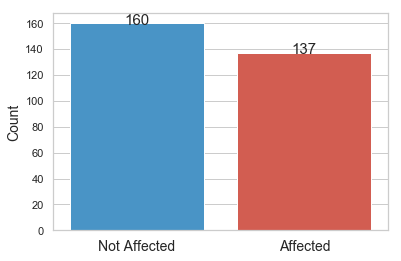

In [7]:
flatui_simple = ["#3498db", "#e74c3c"]
ax=sns.countplot(x='target',data=df, palette=sns.color_palette(flatui_simple));
ax.set_xticklabels(labels=['Not Affected','Affected'], fontsize=14)
ax.set_xlabel('')
ax.set_ylabel("Count",fontsize=14)

for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 3), textcoords = 'offset points', fontsize = 15)

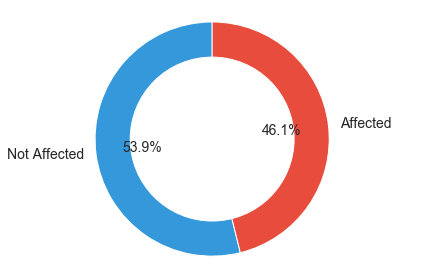

In [8]:
affected = df[(df["target"]==1)].count()[0]
not_affected = df[(df["target"]==0)].count()[0]
tot = df.count()[0]

import matplotlib.pyplot as plt
# Pie chart
labels = ['Not Affected', 'Affected']
sizes = [not_affected/tot, affected/tot]
#colors
flatui_simple = ["#3498db", "#e74c3c"]
 
fig1, ax1 = plt.subplots()
ax1.pie(sizes, colors = flatui_simple, labels=labels, autopct='%1.1f%%', startangle=90,
        textprops={'fontsize': 14})
#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.show()

Note that the majority of samples in our dataset are about people who never had some kind of heart disease.<br>
We have 160 samples of Not Affected vs 137 of Affected People. By the way, this is not a strong predominance.

### Sex Distribution

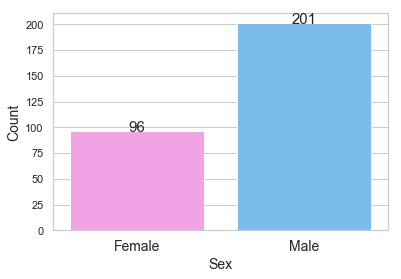

In [9]:
sex_pal = ["#ff96ef", "#68bfff"]
ax = sns.countplot(x='sex',data=df, palette=sns.color_palette(sex_pal));
ax.set_xticklabels(labels=['Female','Male'], fontsize=14);
ax.set_xlabel("Sex",fontsize=14); ax.set_ylabel("Count",fontsize=14);

for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 4), textcoords = 'offset points', fontsize = 15)

Dataset samples are for the majority relative to male patients. Male are more than twice the Female. Our data distribution is biased.

### Affected/Not Affected count w.r.t Sex

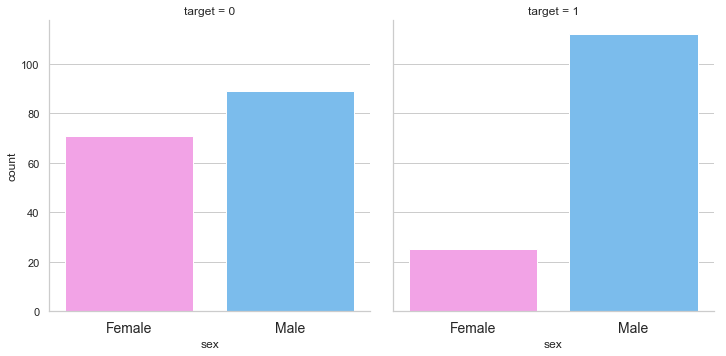

In [10]:
ax1 = sns.catplot(x='sex', col='target', kind='count', data=df, palette=sns.color_palette(sex_pal), estimator=lambda x: len(x));
ax1.set(xticks=[0, 1], xticklabels=['Female', 'Male']);
ax1.set_xticklabels(fontsize=14);

In [11]:
# 1 is for male
# 0 is for female
aff_male = df[(df["target"]==1) & (df["sex"]==1)].count()[0]
aff_female = df[(df["target"]==1) & (df["sex"]==0)].count()[0]
num_male = df[df["sex"]==1].count()[0]
num_female = df[df["sex"]==0].count()[0]
print("Total number of Male subjects is: %d" % num_male)
print("Total number of Female subjects is: %d" % num_female)
print("Number of Heart Diseases Affected male is: %d on %d" % (aff_male, num_male))
print("Number of Heart Diseases Affected female is: %d on %d" % (aff_female, num_female))
male_rate = 100*(aff_male/num_male)  # affected rate for male
female_rate = 100*(aff_female/num_female)  # affected rate for female
print("")
print("Percentage of affected Male: %.02f%% " % male_rate)
print("Percentage of affected Female: %.02f%% " % female_rate)

Total number of Male subjects is: 201
Total number of Female subjects is: 96
Number of Heart Diseases Affected male is: 112 on 201
Number of Heart Diseases Affected female is: 25 on 96

Percentage of affected Male: 55.72% 
Percentage of affected Female: 26.04% 


As we expected the **most affected by heart diseases are Male subjects**. Note that even if our dataset has more than twice male samples w.r.t female ones, more than the half man samples have some kind of heart disease.

### Age distribution

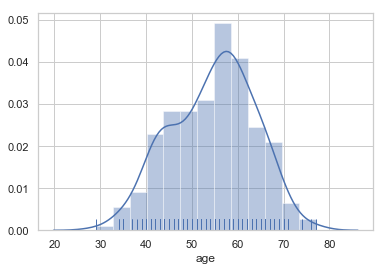

In [12]:
# rug plot draws a small vertical tick at each observation
sns.distplot(df['age'], kde=True, rug=True);

### Age-Target
Quantitative data that we have used is the **age**, and we are comparing it to the categorical variable **target**.

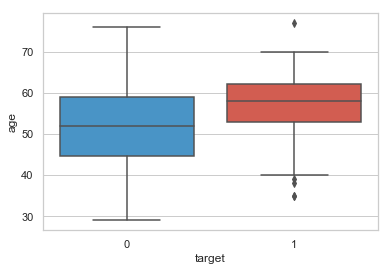

In [13]:
sns.boxplot(x='target',y='age',data=df, palette=sns.color_palette(flatui_simple));

Is interesting to note that the majority of heart diseases affected patient have an AVG age (~60)<br>
Seems that Heart Diseases are more likely to affect people around sixty years old. From the boxplot is also evident the presence of outliers in Target=1 case.<br> The majority of Target-1 outliers have an age between 25 and 40 years old.

### Thalach
Thalach attribute represents the **Maximum heart rate** achieved during thalium stress test.

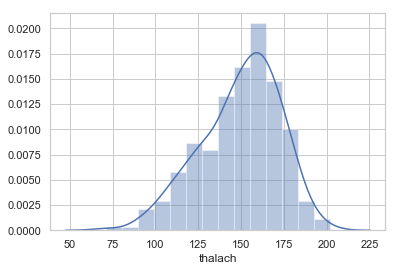

In [14]:
sns.distplot(df['thalach'], kde=True, rug=False);

### Thalach-Target

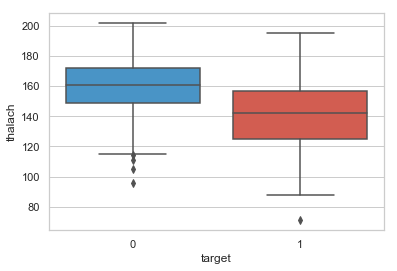

In [15]:
# 'thalach' represents Thalium Test maximum heart rate achieved
sns.boxplot(x='target',y='thalach',data=df, palette=sns.color_palette(flatui_simple));

### Trestbps
Resting blood pressure. Measured in (mm Hg).

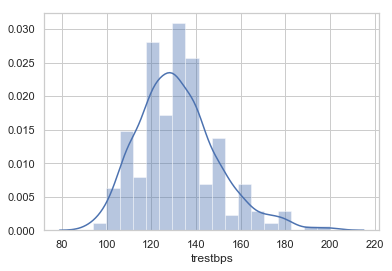

In [16]:
sns.distplot(df['trestbps'], kde=True, rug=False);

### Trestbps-Target

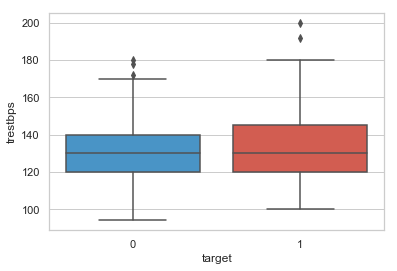

In [17]:
sns.boxplot(x=df['target'], y=df['trestbps'], palette=sns.color_palette(flatui_simple));

Trestbps seems not to be an important feature to discriminate between H.D. affected and Not affected patients.

### Chol
Serum cholesterol. Measured in (mg/dl).

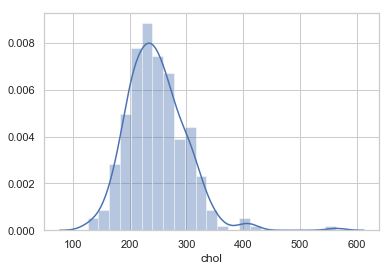

In [18]:
sns.distplot(df['chol'], kde=True, rug=False);

### Chol-Target

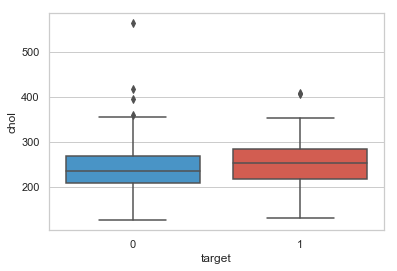

In [19]:
sns.boxplot(x=df['target'], y=df['chol'], palette=sns.color_palette(flatui_simple));

### CP: Chest Pain Type
From UCI Dataset description, this feature can assume 4 different values listed below:
> Value 1: typical angina<br>
> Value 2: atypical angina<br>
> Value 3: non-anginal pain<br>
> Value 4: asymptomatic<br> 

In [20]:
cp_unique = df.cp.unique()
cp_unique.sort()
# counting
print("'Chest Pain Type' feature unique values are: ", cp_unique)
df.cp.value_counts()

'Chest Pain Type' feature unique values are:  [1. 2. 3. 4.]


4.0    142
3.0     83
2.0     49
1.0     23
Name: cp, dtype: int64

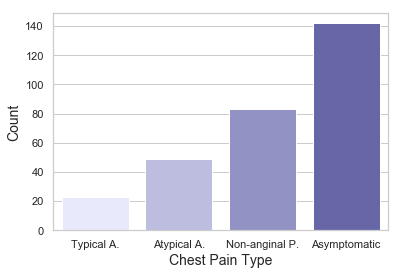

In [21]:
ax = sns.countplot(x='cp',data=df, palette=sns.light_palette("navy"));
ax.set_xticklabels(labels=['Typical A.','Atypical A.', 'Non-anginal P.', 'Asymptomatic']);
ax.set_xlabel("Chest Pain Type",fontsize=14); ax.set_ylabel("Count",fontsize=14);

### CP with respect to Target

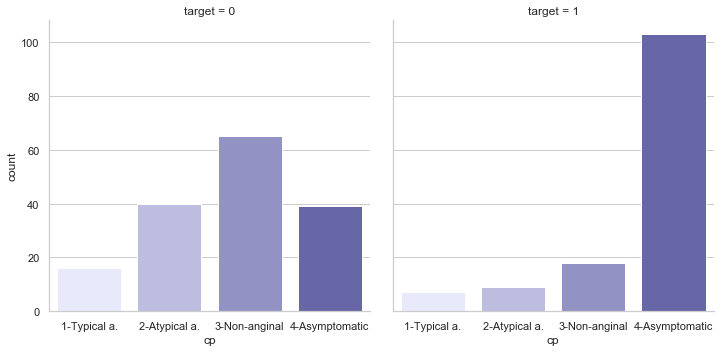

In [22]:
k = sns.catplot(x='cp', col='target', kind='count', data=df,  palette=sns.light_palette("navy"));
k.set(xticks=[0, 1, 2, 3], xticklabels=['1-Typical a.', '2-Atypical a.', '3-Non-anginal', '4-Asymptomatic']);

TODO: Considerations on Chest Pain Type here!

### Thal
Stands for Thalium stress test result (normal, fixed defect, or reversible defect)<br>
> Value 3: normal<br>
> Value 6: fixed defect<br>
> Value 7: reversible defect<br>

In [23]:
thal_unique = df.thal.unique()
thal_unique.sort()
print("'Thal' feature unique values are: ", thal_unique)
print()
df.thal.value_counts()


'Thal' feature unique values are:  [3. 6. 7.]



3.0    164
7.0    115
6.0     18
Name: thal, dtype: int64

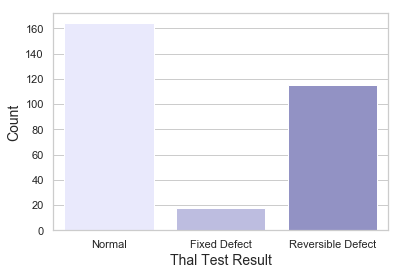

In [24]:
n = sns.countplot(x='thal',data=df, palette=sns.light_palette("navy"));
n.set_xticklabels(labels=['Normal', 'Fixed Defect', 'Reversible Defect']);

#n.set_xticklabels(ax.get_xticklabels(), rotation=10, ha="right")  # xtickslabels rotation
#n.set_xticklabels(ax.get_xticklabels(), fontsize=10)  # xtickslabels font size

n.set_xlabel("Thal Test Result",fontsize=14); n.set_ylabel("Count",fontsize=14);

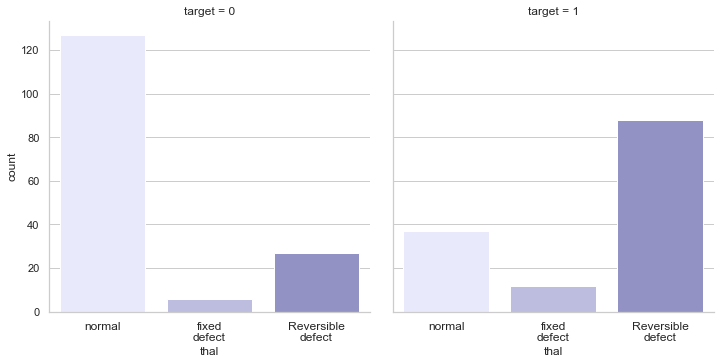

In [25]:
m = sns.catplot(x='thal', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
m.set(xticklabels=['normal', 'fixed\ndefect', 'Reversible\ndefect']);
m.set_xticklabels(fontsize=12);

It's evident from the histograms above that the **majority of Heart Disease affected** samples are characterized by a **Thalium Stress Test Result of 'type 7'** - Reversible Defect.

### FBS
Fasting Blood Sugar (0 if < 120 mg/dl, 1 if > 120 mg/dl)

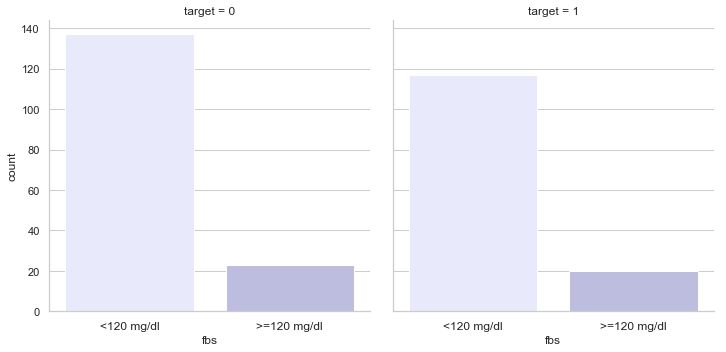

In [26]:
x = sns.catplot(x='fbs', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
x.set(xticks=[0, 1], xticklabels=['<120 mg/dl', '>=120 mg/dl']);
x.set_xticklabels(fontsize=12);

### Restecg
Resting electrocardiographic results. Values:<br>
>**Value 0**: normal<br>
>**Value 1**: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV)<br>
>**Value 2**: showing probable or definite left ventricular hypertrophy by Estes' criteria<br>

In [27]:
restecg_unique = df.restecg.unique()
restecg_unique.sort()
print("'restecg' feature unique values are: ", restecg_unique)
print()
df.restecg.value_counts()

'restecg' feature unique values are:  [0. 1. 2.]



0.0    147
2.0    146
1.0      4
Name: restecg, dtype: int64

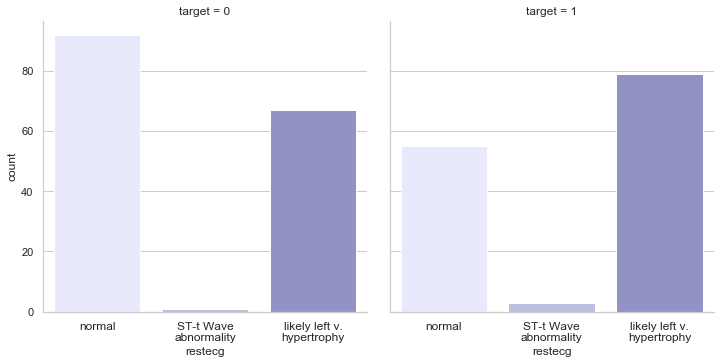

In [28]:
x = sns.catplot(x='restecg', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
x.set(xticks=[0, 1, 2], xticklabels=['normal', 'ST-t Wave\nabnormality', 'likely left v.\nhypertrophy']);
x.set_xticklabels(fontsize=12);

In [29]:
tot_abn = (df['restecg'] == 1).sum()
tot_abn_affected = ((df['target'] == 1) & (df['restecg'] == 1)).sum()
print("Number of Patient having ST-T wave abnormality: ", tot_abn)
print("Number of Patient having ST-T wave abnormality that are Affected: ", tot_abn_affected)

Number of Patient having ST-T wave abnormality:  4
Number of Patient having ST-T wave abnormality that are Affected:  3


Note that our dataset contains only 4 samples in which Resting Electrocardiographic result (restecg) is of type 1, so having ST-T wave abnormality.<br>
Of these 4 samples, 3 are about heart disease affected patients (75%).

### Exang
Exercise induced angina (1=yes or 0=no)	

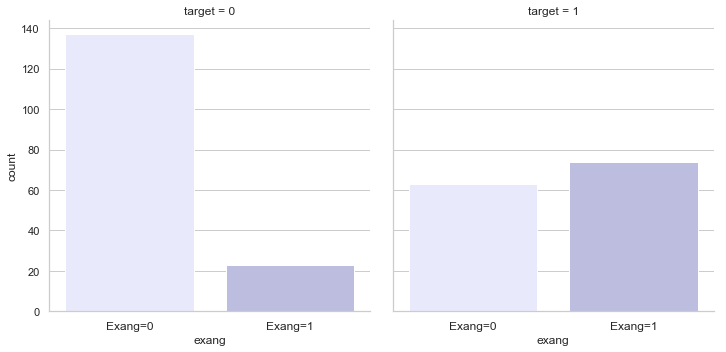

In [30]:
x = sns.catplot(x='exang', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
x.set(xticks=[0, 1], xticklabels=['Exang=0', 'Exang=1']);
x.set_xticklabels(fontsize=12);

### Oldpeak
ST depression induced by exercise relative to rest

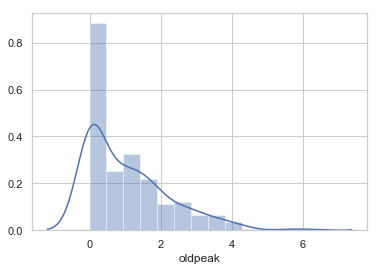

In [31]:
sns.distplot(df['oldpeak'], kde=True, rug=False);

### Slope
The slope of the peak exercise ST segment. Heart Rate slope during peak exercise. Values:<br>
>**Value 1**: downsloping<br>
>**Value 2**: flat<br>
>**Value 3**: upsloping<br>

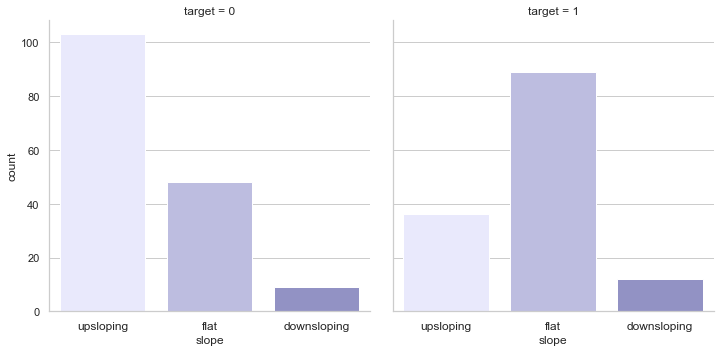

In [32]:
l=sns.catplot(x='slope', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
l.set(xticklabels=['upsloping', 'flat', 'downsloping']);
l.set_xticklabels(fontsize=12);

### CA
When fluoroscopy is used during a cardiac catheterization, the physician can see how blood is moving through the blood vessels and where there are blockages.<br>
Number of major vessels **(0-3)** colored by flourosopy 

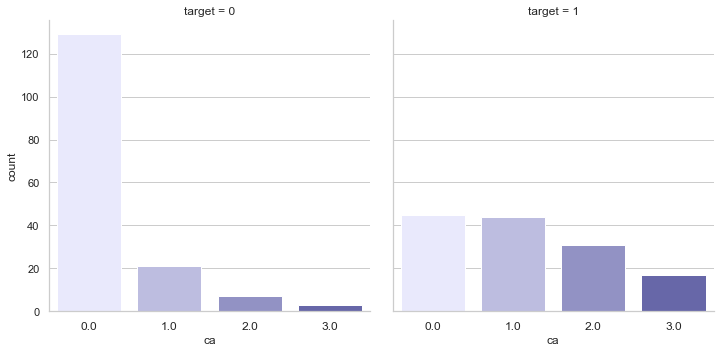

In [33]:
m=sns.catplot(x='ca', col='target', kind='count', data=df, palette=sns.light_palette("navy"));
m.set_xticklabels(fontsize=12);

### Correlation Matrix

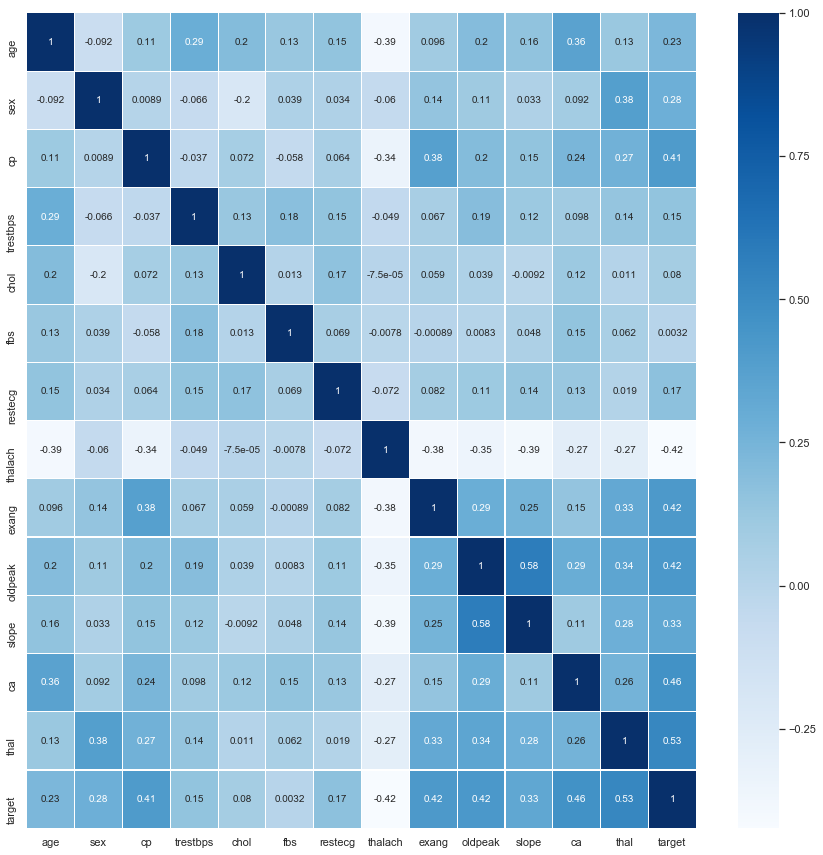

In [34]:
plt.figure(figsize=(15,15))
g=sns.heatmap(df.corr(), annot = True, cmap='Blues',linewidths=.1)
plt.show()

## 2. Preprocessing

In [36]:
pd.options.display.max_colwidth = 150
features_table = pd.read_csv("datasets/features_heart.csv")
display(features_table)

,Extracted Feature,Type,Description
0,age,Continuous,Age in years
1,sex,Binary,1 = male; 0 = female
2,cp,Categorical,"Chest pain type (typical angina, atypical angina, non-anginal, asymptomatic angina)"
3,trestbps,Continuous,Resting blood pressure (in mm Hg)
4,chol,Continuous,Serum cholesterol (in mg/dl)
5,fbs,Binary,"Fasting blood sugar (0 if < 120 mg/dl, 1 if > 120 mg/dl)"
6,restecg,Categorical,"0:normal, 1: ST-T wave abnormality, 2:left ventricular hypertrophy"
7,thalach,Continuous,Maximum heart rate achieved during thalium stress test
8,exang,Binary,"Exercise induced angina (1 = yes, 0 = no)"
9,oldpeak,Continuous,ST depression induced by exercise relative to rest


### Onehot Encoding
As we have seen our dataset contains some categorical data. In our specific case each cat. data value represents a different category, with no ordinal relationship. Some algorithms can work directly with categorical data others don't.<br>
e.g Decision trees can be learned directly from categorical data with no data transformation required (note that this depends on the specific implementation but scikit-learn one does).<br>
At the same time many machine learning algortihms do not handle categorical features at all. They require all input variables and output variables to be numeric. In this case we have to preprocess manually the categorical features, in order to have them in an appropriate format for the machine learning model (usually: numeric features).<br>
<br>
Because of the **lack of ordinal relationship between categories**, I don't want the model to assume a natural order between categories. For this reason I've chosen to use OneHot encoding method.<br>
One hot encoding is a representation of categorical variables as binary vectors:
- You'll have as many columns as you have cardinalities (values) in the categorical variable.<br>
- You'll have a bunch of zeroes and only few 1s! (one 1 per new feature)<br>

OneHot Encoding Example:<br>
<img src="images/onehot_example.jpg" width="300">


Our dataset **categorical** features are:
1. cp
2. restecg
3. slope
4. thal

In [37]:
# OneHot Encoding
# pandas.get_dummies() is actually OneHot encoding
categorical_features = ['cp', 'restecg', 'slope', 'thal']
for feature in categorical_features:
    num_classes = len(df[feature].unique())
    curr_onehot = pd.get_dummies(df[feature], prefix='enc_' + feature)
    df = df.drop(feature, axis=1)
    df = df.join(curr_onehot)

### Dataset normalization

In [38]:
from sklearn.preprocessing import StandardScaler

y = df["target"].values
X = df.drop("target", axis=1).values  # from encoded dataframe, no target column, no normalization yet
print("X shape: ", X.shape)
print("y shape: ", y.shape)
# Fai vedere come non normalizzando c'è outlier a (300, -10)
X_std = StandardScaler(with_mean=True, with_std=True).fit_transform(X)  # Normalization: Mean=0; Variance=1

X shape:  (297, 22)
y shape:  (297,)


### Principle Component Analysis

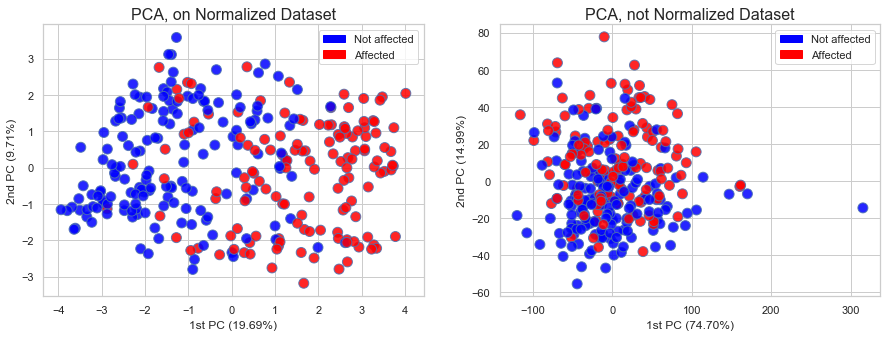

In [39]:
from sklearn.decomposition import PCA
import matplotlib.patches as mpatches

pca, pca1 = PCA(n_components=2), PCA(n_components=2) # all components
X_t = pca.fit_transform(X_std)  # with normalization
X_t1 = pca1.fit_transform(X)  # without normalization, presence of Outliers, this impact on PC1 p.v.e

# Label to color dict (manual)
label_color_dict = {0: 'blue', 1: 'red'}
# Color vector creation
cvec = [label_color_dict[label] for label in y]
# Legend
negative_patch = mpatches.Patch(color='blue', label='Not affected')
positive_patch = mpatches.Patch(color='red', label='Affected')
# 1st and 2nd Components Scatter
fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(121)
ax.set_xlabel('1st PC (%.2f%%)' % (pca.explained_variance_ratio_[0] * 100))
ax.set_ylabel('2nd PC (%.2f%%)' % (pca.explained_variance_ratio_[1] * 100))
ax.set_title('PCA, on Normalized Dataset', fontsize=16)
ax.scatter(X_t[:, 0], X_t[:, 1], c=cvec, edgecolor='b', alpha=0.85, s=100)
ax.legend(handles=[negative_patch, positive_patch])
ax1 = fig.add_subplot(122)
ax1.set_xlabel('1st PC (%.2f%%)' % (pca1.explained_variance_ratio_[0] * 100))
ax1.set_ylabel('2nd PC (%.2f%%)' % (pca1.explained_variance_ratio_[1] * 100))
ax1.set_title('PCA, not Normalized Dataset', fontsize=16)
ax1.scatter(X_t1[:, 0], X_t1[:, 1], c=cvec, edgecolor='b', alpha=0.85, s=100)
ax1.legend(handles=[negative_patch, positive_patch])
plt.show()

## 3. Classification

**Introduction to cross validation!**
    

Utility Functions for decision regions plotting:

In [40]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
def plot_roc_curve(y_test, y_pred, plot_title):
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    plt.figure()
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.suptitle(plot_title, fontsize=14)
    plt.plot(false_positive_rate, true_positive_rate, color='blue', lw=2, label='ROC - Area Under Curve = %0.3f)' % roc_auc)
    plt.legend(loc="lower right")
    plt.show()

In [41]:
def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in
    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional
    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy


def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.
    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out

### 3.1 K-Nearest Neighbors

**Working on Normalized Dataset X_std**, KNN Classifier must compute distances!

https://www.analyticsvidhya.com/blog/2018/03/introduction-k-neighbours-algorithm-clustering/

In [47]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_std, y, test_size=0.30, random_state=0)
print("X_train shape: ", X_train.shape);
print("X_test shape: ", X_test.shape);

X_train shape:  (207, 22)
X_test shape:  (90, 22)


In [48]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

k_values = [1, 2, 3, 10, 20, 30, 40, 50, 70, 100, 189]

#weights_values = ["uniform", "distance"]
#tuned_parameters = {'n_neighbors': k_values, 'weights': weights_values}
tuned_parameters = {'n_neighbors': k_values}

knn_cv = GridSearchCV(KNeighborsClassifier(), tuned_parameters , cv=12, refit=True, return_train_score=True)
knn_cv.fit(X_train, y_train)

print('GridSearchCV 12-Fold on Training Set')
print('CV - Best Parameters are: ', knn_cv.best_params_)

# Mean cross-validated score of the best_estimator
accuracy = 100 * float(knn_cv.best_score_)
print('CV - Best Accuracy Score (AVG on all folds scores) is: %.03f%% ' % accuracy)

# best estimator is accessible by "clf.best_estimator_" if refit=TRUE
print()
print("Using best parameters retrieved by 12-fold CV on Test Set:")
y_pred = knn_cv.best_estimator_.predict(X_test)

test_score = 100 * metrics.accuracy_score(y_test, y_pred) 
knn_f_score = metrics.f1_score(y_test, y_pred) # F-Score

print("knn_cv - With best params from GridSearchCV [n_neighbors=%d]\nAccuracy Score on Test Set is %.2f%%\nF-Score is %.2f" %
      (knn_cv.best_params_['n_neighbors'], test_score,knn_f_score))


GridSearchCV 12-Fold on Training Set
CV - Best Parameters are:  {'n_neighbors': 70}
CV - Best Accuracy Score (AVG on all folds scores) is: 84.058% 

Using best parameters retrieved by 12-fold CV on Test Set:
knn_cv - With best params from GridSearchCV [n_neighbors=70]
Accuracy Score on Test Set is 84.44%
F-Score is 0.82


In [49]:
y_test_knn=y_test
y_pred_knn=y_pred

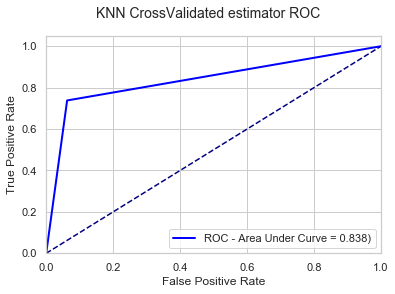

In [50]:
plot_roc_curve(y_test_knn, y_pred_knn, "KNN CrossValidated estimator ROC")

#### GridSearch Table
- **Number of folds** for CrossValidation: 12 <br> 
- **mean_test_score** is the average of Test Scores on all k=12 folds. <br>
- **mean_train_score** is the average of Train Scores on all k=12 folds. <br>

When doing k-fold cross-validation, for each parameters combination possible, we train k models, each one leaving 1/𝑘 portion of the data out. For each of the models, its train error and validation error is computed. The train error will be the error on the data selected to train the model, and the validation error will be computed on the data left out of the training.<br>
For this reason, for each parameters set, we have "k" training errors and "k" validation/test errors, by computing their averages we get: **mean_train_score** and **mean_test_score** for each parameters set.

best parameters: {'n_neighbors': 70}
best score:      0.84058 (+/-0.10341)
{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 70,
 'p': 2,
 'weights': 'uniform'}


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,split10_train_score,split11_train_score,mean_train_score,std_train_score
8,0.000305,4.148476e-05,0.001036,0.000113,70,{'n_neighbors': 70},0.944444,0.944444,0.722222,0.833333,...,0.836842,0.826316,0.842105,0.857895,0.852632,0.831579,0.836842,0.832461,0.839264,0.012056
6,0.000265,1.928241e-06,0.000903,0.000015,40,{'n_neighbors': 40},0.944444,0.888889,0.722222,0.833333,...,0.836842,0.836842,0.831579,0.852632,0.836842,0.831579,0.847368,0.821990,0.835310,0.009636
9,0.000214,3.560938e-05,0.001036,0.000202,100,{'n_neighbors': 100},0.888889,0.944444,0.777778,0.777778,...,0.831579,0.826316,0.821053,0.847368,0.831579,0.826316,0.815789,0.832461,0.830483,0.008997
5,0.000264,2.144295e-06,0.000886,0.000013,30,{'n_neighbors': 30},0.944444,0.888889,0.777778,0.833333,...,0.836842,0.836842,0.836842,0.847368,0.836842,0.815789,0.831579,0.816754,0.830919,0.011654
7,0.000285,6.861183e-05,0.000928,0.000044,50,{'n_neighbors': 50},0.888889,0.888889,0.722222,0.833333,...,0.831579,0.821053,0.826316,0.831579,0.821053,0.810526,0.815789,0.821990,0.822133,0.007507
4,0.000266,2.872589e-06,0.000896,0.000086,20,{'n_neighbors': 20},0.888889,0.888889,0.722222,0.833333,...,0.836842,0.826316,0.826316,0.847368,0.842105,0.815789,0.826316,0.832461,0.830914,0.009782
3,0.000305,5.126312e-05,0.000932,0.000111,10,{'n_neighbors': 10},0.833333,0.777778,0.722222,0.833333,...,0.836842,0.831579,0.836842,0.842105,0.821053,0.821053,0.831579,0.837696,0.833114,0.009200
2,0.000271,7.505348e-07,0.000832,0.000012,3,{'n_neighbors': 3},0.777778,0.888889,0.666667,0.777778,...,0.868421,0.863158,0.857895,0.873684,0.852632,0.847368,0.863158,0.853403,0.859906,0.009451
1,0.000344,3.016081e-05,0.001032,0.000100,2,{'n_neighbors': 2},0.777778,0.777778,0.722222,0.833333,...,0.842105,0.831579,0.836842,0.857895,0.847368,0.831579,0.852632,0.832461,0.840580,0.010995
0,0.000419,5.362152e-05,0.001238,0.000210,1,{'n_neighbors': 1},0.833333,0.722222,0.722222,0.833333,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000


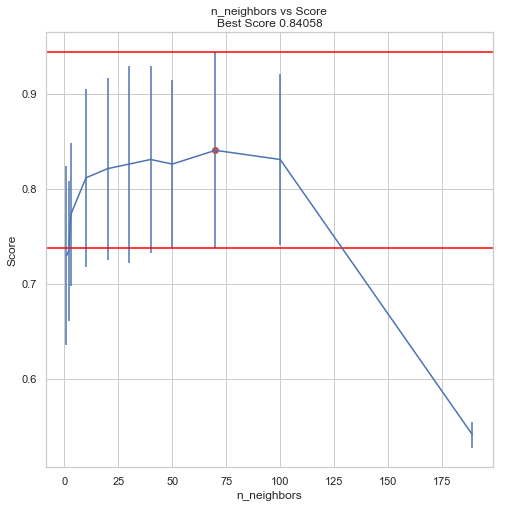

In [51]:
GridSearch_table_plot(knn_cv, "n_neighbors", negative=False);

#### Consideration on plot above
By increasing the number of nearest neighbors considered, classification perfomance of our model decreases.<br>
At some point, depending on different class samples cardinality in our dataset, our model will always choose for the majority class, which is 'Not Affected' (160 not affected vs 137 affected).<br>
Since Not Affected and Affected classes represent respectively  ~54% and ~46% of samples, by increasing the value of n_neighbors parameter, at a certain point ( n_neighbors >= 189 if we use 30% test split size ) our KNN model accuracy will be ~0.54%, always predicting for the majority class, so Not Affected.<br>


#### Scores on Test Set for different K values

In [52]:
#['params', 'rank_test_score', 'mean_train_score', 'mean_test_score'])
df_knn_cv = pd.DataFrame(knn_cv.cv_results_)
cv_mean_train_scores = 100*(df_knn_cv['mean_train_score'].values)  # df is actually sorted by "param_n_neighbors"
cv_mean_test_scores = 100*(df_knn_cv['mean_test_score'].values)
df_knn_cv = df_knn_cv[['param_n_neighbors', 'rank_test_score','mean_train_score','mean_test_score']].sort_values(by=['rank_test_score'])
display(df_knn_cv)

,param_n_neighbors,rank_test_score,mean_train_score,mean_test_score
8,70,1,0.839264,0.840580
6,40,2,0.835310,0.830918
9,100,2,0.830483,0.830918
5,30,4,0.830919,0.826087
7,50,4,0.822133,0.826087
4,20,6,0.830914,0.821256
3,10,7,0.833114,0.811594
2,3,8,0.859906,0.772947
1,2,9,0.840580,0.734300
0,1,10,1.000000,0.729469


In [53]:
k_test_scores = []  # scores on Test Set for different K values, with 'uniform' weights
clf_vect = []  # vector containing fitted classifier for each k value
for k in k_values:
    curr_clf = KNeighborsClassifier(n_neighbors=k, weights='uniform')
    curr_clf.fit(X_train, y_train)
    clf_vect.append(curr_clf)
    y_pred = curr_clf.predict(X_test)
    score = 100 * metrics.accuracy_score(y_test, y_pred)
    k_test_scores.append(score)

In [64]:
# Plotly graph initialization
configure_plotly_browser_state()
init_notebook_mode(connected=False)

trace0 = Scatter(
    x = k_values,
    y = k_test_scores,
    mode = 'lines+markers',
    name = '<b>Score on Test Set</b>',
    line = dict(
        color = ('rgb(255,0,0)'), # red
        width = 4)
      )

trace1 = Scatter(
    x = k_values,
    y = cv_mean_train_scores,
    #mode = 'lines+markers',
    mode = 'lines',
    name = 'Mean Train Score',
    line = dict(
        color = ('rgb(49,130,189)'), # light blue
        width = 4)
      )
trace2 = Scatter(
    x = k_values,
    y = cv_mean_test_scores,
    mode = 'lines+markers',
    name = 'Mean Test Score',
    line = dict(
        color = ('rgb(47,79,79)'), # grey
        width = 3)
      )

In [68]:
# subplot style
fig = tools.make_subplots(rows=3, cols=1,subplot_titles=
                          ('<b>Cross-Validation Train Scores</b>',
                           '<b>Cross-Validation Test Scores</b>',
                           '<b>Test Set Scores</b>'), shared_xaxes=True)
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace0, 3, 1)
fig['layout'].update(title='KNN Scores', height=600) # in there height=600, width=600,
fig['layout']['xaxis'].update(title='n_neighbors') #shared axis X
plotly.offline.iplot(fig, filename='stacked-knn-scores')

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]



<font color='color'> **Cannot plot decision regions if we are in a space with higher dimensionality than 2d!** </font>

### 3.2 Support Vector Machine

Note that:
- Feature Extraction<br>
As the dimension (number of features) increase, it will be harder to do the data mining task such as
classification. To solve that problem, Feature Extraction namely PCA which extract original features
into a new features using mapping function is used. PCA processes include: data centering, calculate
covarian matrix, calculate Eigenvector and Eigenvalue, select top Eigenvector, and transformation
data.<br><br>
- Classification<br>
Support Vector Machine (SVM) is well known as a classifier which can model complex data, has
good accuracy and less prone to overfitting. SVM works by searching the linear optimal separating
hyperplane (decision boundary). The rationale is that decision boundary with large margin is better
when handling unseen data compared to decision boundary with small margin. When the data are not
linearly separable, SVM transform original data into a higher dimension using a nonlinear mapping to
obtain the separating hyperplane.
<br>
see ref.: https://iopscience.iop.org/article/10.1088/1742-6596/971/1/012003/pdf

In [23]:
# Wotkin' on 2-PCA Transformed dataset
# Considering only first two principal components
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_t, y, test_size=0.30, random_state=0)
print("X_train shape: ", X_train.shape); print("y_train shape: ", y_train.shape)

X_train shape:  (207, 2)
y_train shape:  (207,)


#### Example of different kernel and decision boundaries

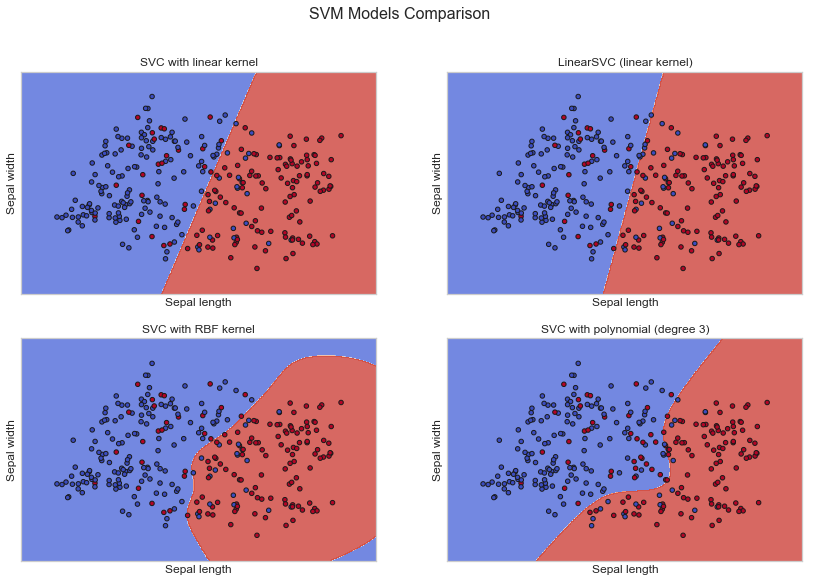

In [24]:
from sklearn import svm
import numpy as np

C = 1.0  # SVM regularization -hyperparameter
# training different SVM models
models = (svm.SVC(kernel='linear', C=C),
          svm.LinearSVC(C=C),
          svm.SVC(kernel='rbf', gamma=0.7, C=C),
          svm.SVC(kernel='poly', degree=3, C=C))

models = (clf.fit(X_t, y) for clf in models)
# title for the plots
titles = ('SVC with linear kernel',
          'LinearSVC (linear kernel)',
          'SVC with RBF kernel',
          'SVC with polynomial (degree 3)')

fig, sub = plt.subplots(2, 2, figsize=(14,9))
fig.suptitle('SVM Models Comparison', size=16) # or plt.suptitle('Main title')
plt.subplots_adjust(wspace=0.2, hspace=0.2)
X0, X1 = X_t[:, 0], X_t[:, 1]
xx, yy = make_meshgrid(X0, X1)
for clf, title, ax in zip(models, titles, sub.flatten()):
    plot_contours(ax, clf, xx, yy,
                  cmap=plt.cm.coolwarm, alpha=0.8)
    ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel('Sepal length')
    ax.set_ylabel('Sepal width')
    ax.set_xticks(()) 
    ax.set_yticks(())
    ax.set_title(title)
plt.show()

#### SVM parameters Tuning - CrossValidation

In [25]:
# Tuning Parameters
tuned_parameters = [{'kernel': ['rbf'], 'gamma': [10, 1, 1e-2, 1e-3, 1e-4, 1e-5],
                     'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]},
                    {'kernel': ['sigmoid'], 'gamma': [10, 1, 1e-2, 1e-3, 1e-4, 1e-5],
                     'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]},
                    {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 10, 25, 50, 100, 1000]}
                   ]

In [31]:
# GridSearchCV
# performing 12-fold validation
svm_cv = GridSearchCV(svm.SVC(), tuned_parameters, cv=12, refit=True, return_train_score=True)
svm_cv.fit(X_train, y_train)
print('GridSearchCV 12-Fold on Training Set.\nBest_params= %s with best_score_= %.03f'%
      (svm_cv.best_params_, 100*float(svm_cv.best_score_)))

GridSearchCV 12-Fold on Training Set.
Best_params= {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'} with best_score_= 85.024


In [35]:
#['params', 'rank_test_score', 'mean_train_score', 'mean_test_score'])
df_svm_cv = pd.DataFrame(svm_cv.cv_results_)
# selecting only the interesting columns
df_svm_cv = df_svm_cv[['params', 'rank_test_score','mean_train_score','mean_test_score']].sort_values(by=['rank_test_score'])
# cv_svm_train_scores = 100*(df_svm_cv['mean_train_score'].values)
# cv_sv_test_scores = 100*(df_svm_cv['mean_test_score'].values)
df_svm_cv.head(10) # show some parameters combination, ordered by rank, first 10 rows

,params,rank_test_score,mean_train_score,mean_test_score
20,"{'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}",1,0.849368,0.850242
74,"{'C': 25, 'gamma': 0.01, 'kernel': 'sigmoid'}",2,0.847170,0.845411
33,"{'C': 50, 'gamma': 0.001, 'kernel': 'rbf'}",2,0.847611,0.845411
39,"{'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}",2,0.848050,0.845411
21,"{'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}",2,0.838837,0.845411
40,"{'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}",2,0.838837,0.845411
46,"{'C': 1000, 'gamma': 0.0001, 'kernel': 'rbf'}",2,0.847611,0.845411
94,"{'C': 1000, 'gamma': 0.0001, 'kernel': 'sigmoid'}",2,0.847170,0.845411
47,"{'C': 1000, 'gamma': 1e-05, 'kernel': 'rbf'}",2,0.838837,0.845411
87,"{'C': 100, 'gamma': 0.001, 'kernel': 'sigmoid'}",2,0.847170,0.845411


In [36]:
y_pred_svm=y_pred
y_test_svm=y_test

SVM CV - best params from GridSearchCV are: [Kernel: rbf, C: 10.000 , gamma: 0.010]
Accuracy Score on Test Set is: 82.22%
F-Score is: 0.79


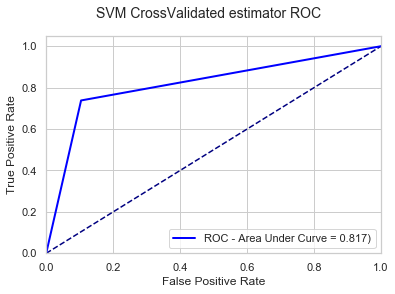

In [37]:
# best estimator is accessible by "clf2.best_estimator_" if refit=TRUE
y_pred = svm_cv.best_estimator_.predict(X_test)

score = 100 * metrics.accuracy_score(y_test, y_pred)
svm_f_score = metrics.f1_score(y_test, y_pred) # F-Score

print("SVM CV - best params from GridSearchCV are: [Kernel: %s, C: %.3f ,gamma: %.3f]\nAccuracy Score on Test Set is: %.2f%%\nF-Score is: %.2f" %
      (svm_cv.best_params_['kernel'], svm_cv.best_params_['C'], svm_cv.best_params_['gamma'], score, svm_f_score))
plot_roc_curve(y_test_svm, y_pred_svm, "SVM CrossValidated estimator ROC")

#### SVM Classifier Model trained on "best" CrossValidated parameters

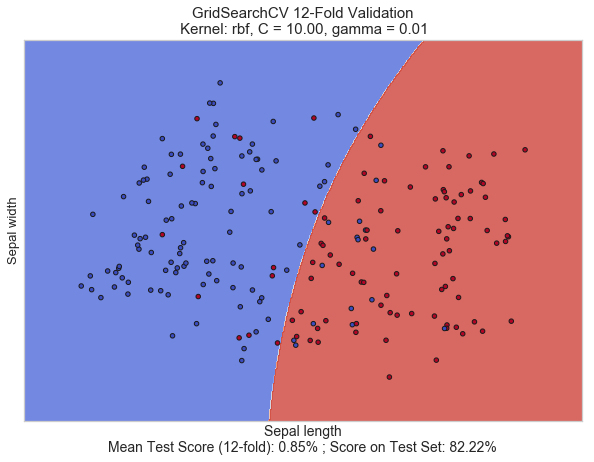

In [38]:
# Plotting decision boundaries:
X0, X1 = X_train[:, 0], X_train[:, 1]
xx, yy = make_meshgrid(X0, X1)
fig2 = plt.figure(2, figsize=(10, 7))
ax3 = fig2.add_subplot(111)
plot_contours(ax3, svm_cv.best_estimator_, xx, yy,  # using Best estimator
              cmap=plt.cm.coolwarm, alpha=0.8)
ax3.scatter(X0, X1, c=y_train, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
ax3.set_xlim(xx.min(), xx.max())
ax3.set_ylim(yy.min(), yy.max())
# scores x label
ax3.set_xlabel('Sepal length\nMean Test Score (12-fold): %.02f%% ; Score on Test Set: %.02f%%' % (svm_cv.best_score_, score), fontsize=14)
ax3.set_ylabel('Sepal width', fontsize=13)
ax3.set_xticks(())
ax3.set_yticks(())
ax3.set_title(
    'GridSearchCV %d-Fold Validation\n Kernel: %s, C = %.02f, gamma = %.02f' % (12, svm_cv.best_params_['kernel'] ,svm_cv.best_params_['C'], svm_cv.best_params_['gamma']), fontsize=15);


#### SVM: Boundaries Analysis

In [39]:
df_svm_cv.head(10) # show some parameters combination, ordered by rank, first 10 rows

,params,rank_test_score,mean_train_score,mean_test_score
20,"{'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}",1,0.849368,0.850242
74,"{'C': 25, 'gamma': 0.01, 'kernel': 'sigmoid'}",2,0.847170,0.845411
33,"{'C': 50, 'gamma': 0.001, 'kernel': 'rbf'}",2,0.847611,0.845411
39,"{'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}",2,0.848050,0.845411
21,"{'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}",2,0.838837,0.845411
40,"{'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}",2,0.838837,0.845411
46,"{'C': 1000, 'gamma': 0.0001, 'kernel': 'rbf'}",2,0.847611,0.845411
94,"{'C': 1000, 'gamma': 0.0001, 'kernel': 'sigmoid'}",2,0.847170,0.845411
47,"{'C': 1000, 'gamma': 1e-05, 'kernel': 'rbf'}",2,0.838837,0.845411
87,"{'C': 100, 'gamma': 0.001, 'kernel': 'sigmoid'}",2,0.847170,0.845411


In [40]:
# some SVM models
m=[]; t=[]

# rank 1, params set 20
m.append(svm.SVC(kernel='rbf', C=10, gamma = 0.01))
t.append("C: 10, gamma: 0.01, kernel: rbf\n mean_test_score: 0.85024")
# rank 2, params set 74
m.append(svm.SVC(kernel='sigmoid', C=25, gamma = 0.01))
t.append("C: 25, gamma: 0.01, kernel: sigmoid\n mean_test_score: 0.84541")
# rank 2, params set 33
m.append(svm.SVC(kernel='rbf', C=50, gamma = 0.001))
t.append("C: 50, gamma: 0.001, kernel: rbf\n mean_test_score: 0.84541")
# rank 2, params set 94
m.append(svm.SVC(kernel='sigmoid', C=1000, gamma = 0.0001))
t.append("C: 1000, gamma: 0.0001, kernel: sigmoid\n mean_test_score: 0.84541")

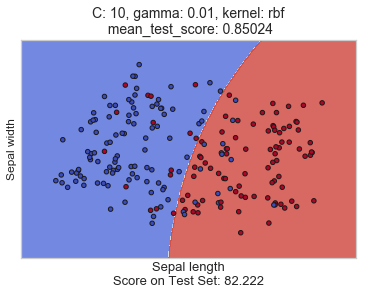

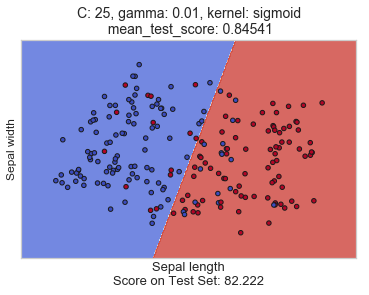

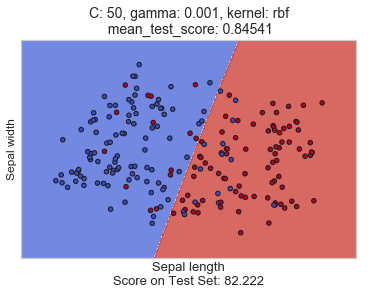

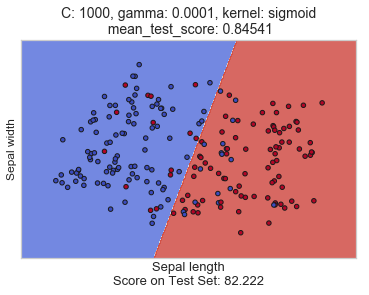

In [41]:
for m_value, t_value in zip(m,t):
    curr_clf = m_value
    curr_clf.fit(X_train, y_train)
    curr_pred = curr_clf.predict(X_test)
    score = 100 * metrics.accuracy_score(y_test, curr_pred)
    X0, X1 = X_train[:, 0], X_train[:, 1]
    xx, yy = make_meshgrid(X0, X1)
    fig = plt.figure()
    ax = fig.add_subplot(111)
    plot_contours(ax, curr_clf, xx, yy,
                  cmap=plt.cm.coolwarm, alpha=0.8)
    ax.scatter(X0, X1, c=y_train, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    # scores x label
    ax.set_xlabel(
        'Sepal length\nScore on Test Set: %.03f' % (score),
         fontsize=13)
    ax.set_ylabel('Sepal width', fontsize=12)
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(
        t_value , fontsize=14)
    plt.show()

### Dataset for DecisionTree, Random Forest

In [42]:
features = ['age','sex','cp','trestbps','chol','fbs','restecg','thalach','exang',
            'oldpeak','slope','ca','thal','target']
df = pd.read_csv("processed_cleveland.data", names=features)

# processing Target
target_dict = {0: 0, 1: 1, 2: 1, 3: 1, 4: 1}
y = df.target.map(target_dict).values
df.drop(labels='target', axis="columns", inplace=True)
feature_names = df.columns.values
X = df.values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)  # no normalization
print('Training Set Shape is: ', X_train.shape)
print('Test Set Shape is: ', X_test.shape)

Training Set Shape is:  (207, 13)
Test Set Shape is:  (90, 13)


### 3.1 DecisionTree

- Scikit-learn DecisionTree classifier should not require normalized data (because it hasn't to compute any distance).<br>
- Scikit-learn DecisionTree classifier is also able to handle both numerical and categorical data, so no encoding is needed.

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')

DecisionTreeClassifier Score on Test Set: 74.444
F-Score : 0.736


                   Predicted Not Affected  Predicted Affected
True Not Affected                      35                  13
True Affected                          10                  32


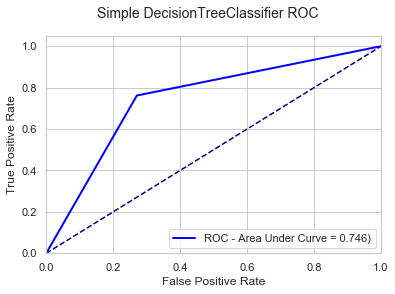

In [44]:
from sklearn import tree
tree_clf = tree.DecisionTreeClassifier(criterion='gini', random_state=0)
print(tree_clf)
print()
tree_clf.fit(X_train, y_train)
y_pred_tree = tree_clf.predict(X_test)

score = 100 * metrics.accuracy_score(y_test, y_pred_tree)
tree_f_score = metrics.f1_score(y_test, y_pred_tree) # F-Score
print("DecisionTreeClassifier Score on Test Set: %.03f\nF-Score : %.03f" % (score, tree_f_score))

print()
print()

cm = metrics.confusion_matrix(y_test, y_pred_tree)
cm_table = pd.DataFrame(
    cm,
    columns=['Predicted Not Affected', 'Predicted Affected'],
    index=['True Not Affected', 'True Affected']
)
print(cm_table)
plot_roc_curve(y_test, y_pred_tree, "Simple DecisionTreeClassifier ROC")
# # export tree image
# tree.export_graphviz(tree_clf, out_file='tree.dot', feature_names=feature_names)
# from subprocess import call
# call(['dot', '-T', 'png', 'tree.dot', '-o', 'tree_w_onehot.png'])

# cons
# https://medium.com/@mohtedibf/indepth-parameter-tuning-for-decision-tree-6753118a03c3

#### Decision Tree Classifier Parameters - AUC ROC

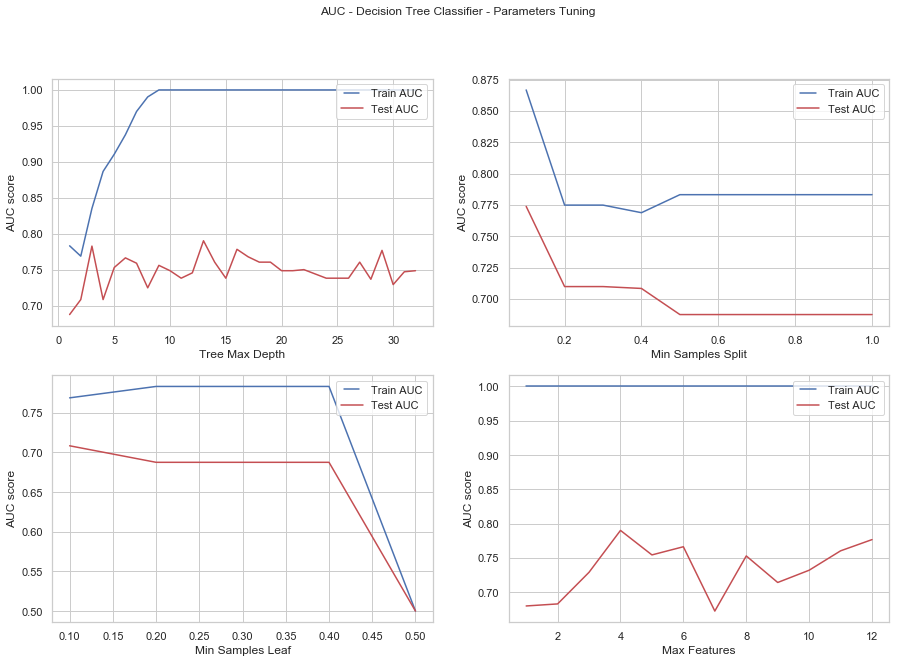

In [45]:
import numpy as np
# general analysis
from matplotlib.legend_handler import HandlerLine2D
print()
# max depth analysis
max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
test_results = []
for max_depth in max_depths:
    dt = tree.DecisionTreeClassifier(max_depth=max_depth)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    # Add auc score to previous train results
    train_results.append(roc_auc)
    y_pred = dt.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    # Add auc score to previous test results
    test_results.append(roc_auc)

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(221)
line1, = ax.plot(max_depths, train_results, 'b', label="Train AUC")
line2, = ax.plot(max_depths, test_results, 'r', label="Test AUC")
ax.set(xlabel="Tree Max Depth")
plt.ylabel("AUC score")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)}, loc=1)

# min samples split analysis
min_samples_splits = np.linspace(0.1, 1.0, 10, endpoint=True)
train_results = []
test_results = []
for min_samples_split in min_samples_splits:
    dt = tree.DecisionTreeClassifier(min_samples_split=min_samples_split)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_results.append(roc_auc)
    y_pred = dt.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_results.append(roc_auc)

ax2 = fig.add_subplot(222)
line1, = ax2.plot(min_samples_splits, train_results, 'b', label="Train AUC")
line2, = ax2.plot(min_samples_splits, test_results, 'r', label="Test AUC")
ax2.set(xlabel="Min Samples Split")
plt.ylabel("AUC score")  # in common
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)}, loc=1)

# min samples leafs analysis
min_samples_leafs = np.linspace(0.1, 0.5, 5, endpoint=True)
train_results = []
test_results = []
for min_samples_leaf in min_samples_leafs:
    dt = tree.DecisionTreeClassifier(min_samples_leaf=min_samples_leaf)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_results.append(roc_auc)
    y_pred = dt.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_results.append(roc_auc)

ax3 = fig.add_subplot(223)
ax3.set(xlabel="Min Samples Leaf")
line1, = ax3.plot(min_samples_leafs, train_results, 'b', label="Train AUC")
line2, = ax3.plot(min_samples_leafs, test_results, 'r', label="Test AUC")
plt.ylabel("AUC score")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)}, loc=1)


# max features analysis
max_features = list(range(1, X_train.shape[1]))
train_results = []
test_results = []
for max_feature in max_features:
    dt = tree.DecisionTreeClassifier(max_features=max_feature)
    dt.fit(X_train, y_train)
    train_pred = dt.predict(X_train)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    train_results.append(roc_auc)
    y_pred = dt.predict(X_test)
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    test_results.append(roc_auc)

ax4 = fig.add_subplot(224)
ax4.set(xlabel="Max Features")
line1, = ax4.plot(max_features, train_results, 'b', label="Train AUC")
line2, = ax4.plot(max_features, test_results, 'r', label="Test AUC")
plt.ylabel("AUC score")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)}, loc=1)
fig.suptitle("AUC - Decision Tree Classifier - Parameters Tuning")
plt.show()

### 3.1 Random Forest

In [48]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
# Parameters Tuning
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid

tuned_parameters = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

**ATTENTION** Computational Heavy

In [79]:

# cv_rf = GridSearchCV(RandomForestClassifier(), tuned_parameters, cv=5, refit=True, return_train_score=True)
cv_rf = RandomizedSearchCV(RandomForestClassifier(), tuned_parameters, cv=6, n_iter=100, refit=True, random_state=0, verbose=2, return_train_score=True, n_jobs=12)
cv_rf.fit(X_train, y_train)

print('RandomizedSearchCV 6-Fold on Training Set')
print('Best_parameters are: ', cv_rf.best_params_)
cv_rf_accuracy = 100 * float(cv_rf.best_score_)
print('Accuracy Score (AVG on all folds scores) is: %.03f%% ' % cv_rf_accuracy)
print()

# best estimator is accessible by "clf2.best_estimator_" if refit=TRUE
y_pred = cv_rf.best_estimator_.predict(X_test)
score = 100 * metrics.accuracy_score(y_test, y_pred)
print("cv_rf - Accuracy Score on Test Set is %.2f%%" % score)

# Result of RandomizedSearchCV with fixed random states, too computational expensive re-doing it each time..
# GridSearchCV 5-Fold on Training Set
# Best_parameters are:  {'n_estimators': 800, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'auto', 'max_depth': 90, 'bootstrap': True}
# Accuracy Score (AVG on all folds scores) is: 84.058%
# cv_rf - Accuracy Score on Test Set is 86.67%

Fitting 6 folds for each of 100 candidates, totalling 600 fits


[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  17 tasks      | elapsed:    3.3s
[Parallel(n_jobs=12)]: Done 138 tasks      | elapsed:   18.0s
[Parallel(n_jobs=12)]: Done 341 tasks      | elapsed:   49.8s
[Parallel(n_jobs=12)]: Done 600 out of 600 | elapsed:  1.4min finished


RandomizedSearchCV 6-Fold on Training Set
Best_parameters are:  {'n_estimators': 800, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 110, 'bootstrap': True}
Accuracy Score (AVG on all folds scores) is: 83.092% 

cv_rf - Accuracy Score on Test Set is 81.11%


RandomForestClassifier(bootstrap='True', class_weight=None, criterion='gini',
            max_depth=110, max_features='sqrt', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=2, min_samples_split=10,
            min_weight_fraction_leaf=0.0, n_estimators=800, n_jobs=None,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

tuned_rf - Accuracy Score on Test Set is 82.222%
F-Score: 0.789


                   Predicted Not Affected  Predicted Affected
True Not Affected                      44                   4
True Affected                          12                  30



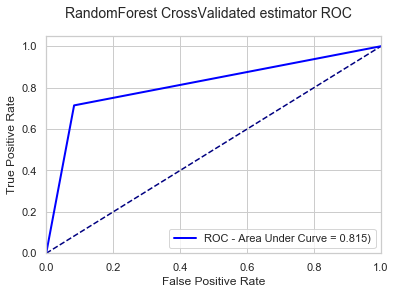

In [51]:
# 82.2% on on Test Set
# tuned_rf = RandomForestClassifier(n_estimators=800, min_samples_split=10, min_samples_leaf=4,
#                                  max_features='auto', max_depth=90, bootstrap='True', random_state=0)

tuned_rf = RandomForestClassifier(n_estimators=800, min_samples_split=10, min_samples_leaf=2,
                                  max_features='sqrt', max_depth=110, bootstrap='True', random_state=0)
print(tuned_rf)
print()
tuned_rf.fit(X_train, y_train)
y_pred_rf = tuned_rf.predict(X_test)

score = 100 * metrics.accuracy_score(y_test, y_pred_rf)
rf_f_score = metrics.f1_score(y_test, y_pred_rf) # F-Score

print("tuned_rf - Accuracy Score on Test Set is %.3f%%\nF-Score: %.03f" % (score, rf_f_score))
print()

# ROC Curve - UAC
cm = metrics.confusion_matrix(y_test, y_pred_rf)
cm_table = pd.DataFrame(
    cm,
    columns=['Predicted Not Affected', 'Predicted Affected'],
    index=['True Not Affected', 'True Affected'])
print()
print(cm_table)
print()
plot_roc_curve(y_test, y_pred_rf, "RandomForest CrossValidated estimator ROC")

In [55]:
# function for sub-plotting roc curve
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
def subplot_roc_curve(fig, numsub, y_test, y_pred, subplot_title, color):
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    ax = fig.add_subplot(numsub)
    ax.set(xlabel='False Positive Rate')
    plt.ylabel('True Positive Rate')
    ax.plot([0, 1], [0, 1], color="k", linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    ax.set_title(subplot_title, fontsize=15)
    ax.plot(false_positive_rate, true_positive_rate, color=color, lw=2, label='ROC - Area Under Curve = %0.3f)' % roc_auc)
    plt.legend(loc=1)

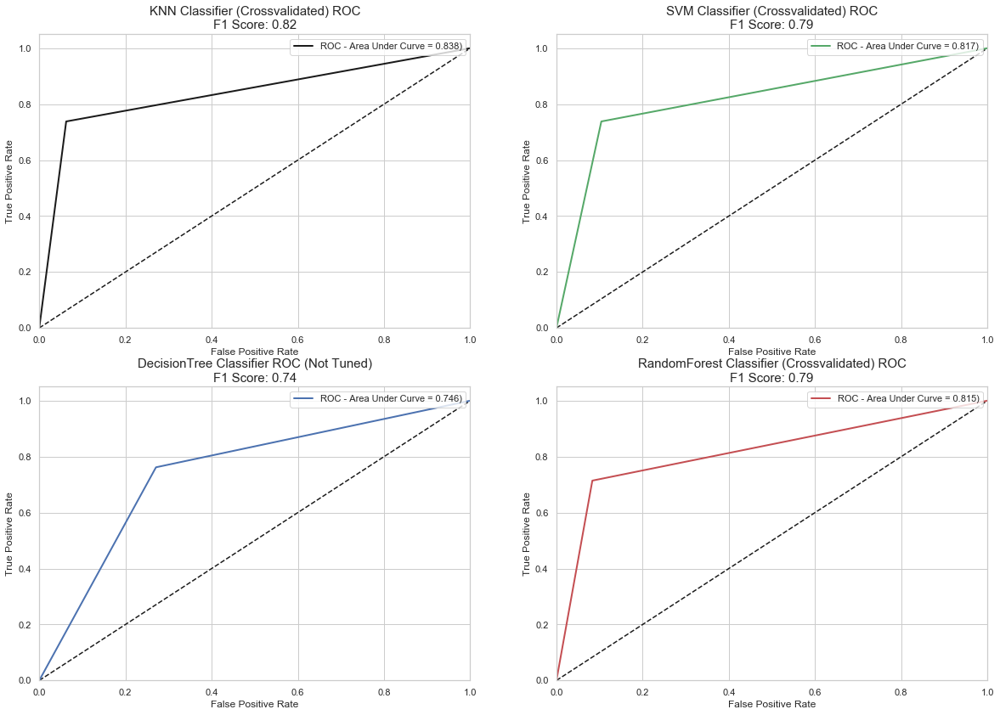


KNN CrossValidated, F-Score: 0.82
SVM CrossValidated, F-Score: 0.79
DecisionTree Classifier, F-Score: 0.74
RandomForest CrossValidated, F-Score: 0.79


In [61]:
fig = plt.figure(figsize=(20,14))
subplot_roc_curve(fig, 221, y_test_knn, y_pred_knn, "KNN Classifier (Crossvalidated) ROC\nF1 Score: %.02f" % knn_f_score, "k")
subplot_roc_curve(fig, 222, y_test_svm, y_pred_svm, "SVM Classifier (Crossvalidated) ROC\nF1 Score: %.02f" % svm_f_score, "g")
subplot_roc_curve(fig, 223, y_test, y_pred_tree, "DecisionTree Classifier ROC (Not Tuned)\nF1 Score: %.02f" % tree_f_score, "b")
subplot_roc_curve(fig, 224, y_test, y_pred_rf, "RandomForest Classifier (Crossvalidated) ROC\nF1 Score: %.02f" % rf_f_score, "r")
plt.show()
print()
print("KNN CrossValidated, F-Score: %.02f" % knn_f_score)
print("SVM CrossValidated, F-Score: %.02f" % svm_f_score)
print("DecisionTree Classifier, F-Score: %.02f" % tree_f_score)
print("RandomForest CrossValidated, F-Score: %.02f" % rf_f_score)